# Data for GOOD

**Dans ce challenge, ouvert à tous, vous allez réaliser une analyse exploratoire avec un jeu de données portant sur les arbres de la ville de Paris, dans le cadre du programme "Végétalisons la ville".
Votre solution contribuera à une optimisation des tournées pour l’entretien des arbres de la ville.**

1. Les données doivent être explorées à l’aide de Python et de ses librairies. 
Vous soumettrez votre analyse sous forme de présentation, contenant les informations suivantes : <br>
 _ Présentation générale du jeu de données <br>
 _ Démarche méthodologique d’analyse de données <br>
 _ Synthèse de l’analyse de données
2. Le second livrable prendra la forme d’un Notebook Jupyter. Le Notebook sera documenté pour expliciter les différents traitements, calculs ou graphiques que vous effectuez en utilisant les fonctionnalités d’édition de texte de Jupyter. Vos explications doivent permettre à un public non technique de comprendre les différentes étapes de votre analyse et votre synthèse.
3. Le troisième livrable ( optionnel mais permettra de se différencier des autres participants) prendra la forme d’un dashboard PowerBI avec au moins 4 visualisations 

Vous travaillez en binôme et vous avez 20 min pour présenter votre solution

## 1. Importation des librairies et Chargement des données

In [1]:
# import des librairies
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly as py
import plotly.express as px
import plotly.graph_objects as go

In [2]:
# Récupération des données dans un dataframe (~tableur)
DATA_PATH = 'data/'
DATA_NAME = 'p2-arbres-fr.csv'

data = pd.read_csv(DATA_PATH + DATA_NAME, sep=';')

# 2. Nettoyage des données

## a. Quelle variable pour l'espèce d'arbre ?

In [3]:
genre_na = data.genre.isna().sum()
genre_unique = data.genre.unique().shape
print(f"La variable 'genre' a {genre_na} valeurs manquantes pour {genre_unique} valeurs uniques.")

espece_na = data.espece.isna().sum()
espece_unique = data.espece.unique().shape
print(f"La variable 'espece' a {espece_na} valeurs manquantes pour {espece_unique} valeurs uniques.")

variete_na = data.variete.isna().sum()
variete_unique = data.variete.unique().shape
print(f"La variable 'variete' a {variete_na} valeurs manquantes pour {variete_unique} valeurs uniques.")

La variable 'genre' a 16 valeurs manquantes pour (176,) valeurs uniques.
La variable 'espece' a 1752 valeurs manquantes pour (540,) valeurs uniques.
La variable 'variete' a 163360 valeurs manquantes pour (437,) valeurs uniques.


La variable Genre comporte le moins de valeurs manquantes et le moins de valeurs uniques, ce qui rend l'analyse de la répartition des arbres plus pertinente et pratique. 

## b. Valeurs aberrantes 

Considérant le grand nombre d'arbres d'une circonference/hauteur égale à 0, nous les conservons dans l'analyse

### Hauteur

In [4]:
data.hauteur_m.sort_values(ascending=False).iloc[:20]

182852    881818
150101      5155
152110      2525
101985      2015
152205      1815
147984      1610
152437      1515
152238      1515
151382      1515
153314      1514
147229      1512
96481       1511
152339      1510
5392        1510
168580      1216
68681       1211
158359      1113
107327      1010
153036       818
151364       815
Name: hauteur_m, dtype: int64

In [5]:
data[data.hauteur_m > 30].shape

(573, 18)

On constate que beaucoup de valeurs de la variable hauteur_m sont aberrantes, aucun arbre ne fait jusqu'à 1km de haut, pas même 200m. 

Nos recherches ont montré que la taille maximale d'un arbre à Paris est 30m, et le nombre d'observations supérieures à ce nombre est négligeable face au total d'arbre dans la ville. Cependant, nous partons de l'hypothèse que les employés chargés des mesures ont rentrés les données en centimètres, et non pas en mètres. Afin de conserver ces données, nous avons décidé d'isoler les arbres de plus de 30m étant marqués comme juvéniles ou jeune adultes (J ou JA dans la variable stade_developpement) et de diviser leur hauteur par 100.


In [6]:
mask = ((data.hauteur_m > 30) & (data.stade_developpement.isin(['J', 'JA'])))
data[mask].shape

(355, 18)

355 valeurs ont donc pu être conservées, le reste est considéré comme non-significatif. Pour éviter les valeurs aberrantes, on supprime les 120 arbres malgré tout d'une taille supérieure à 50m

In [7]:
data.loc[mask, 'hauteur_m'] = data.loc[mask, 'hauteur_m'] / 100
data = data[(data.hauteur_m < 50)]

### Circonférence

Malheureusement, la circonférence varie beaucoup plus d'une espèce à l'autre, un cyprès peut être immense et très fin en comparaison d'un platane de même taille. 

C:\anaconda\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='circonference_cm'>

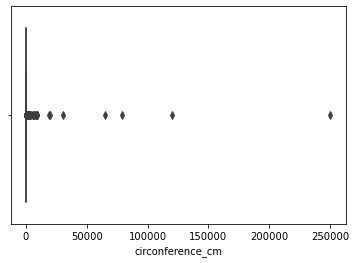

In [8]:
sns.boxplot(data.circonference_cm)

In [9]:
data.circonference_cm.sort_values(ascending=False)[:20]

149056    250255
160432    120170
173343     79120
147634     65110
91256      30140
90605      20130
71787      18589
147235      9155
164616      9095
152303      9085
103437      9035
97354       8110
151364      7540
148106      6595
170367      6125
148481      6120
163918      6085
82951       5545
133546      4090
167606      3630
Name: circonference_cm, dtype: int64

Cela-dit, on peut être certains qu'aucun arbre ne fait plus de 15m de diamètre.

In [10]:
data[(data.circonference_cm > 1500)].shape

(35, 18)

Seulement 35 valeurs sont affectées, on décide donc de les supprimer du dataset

In [11]:
data = data[(data.circonference_cm < 1500)]

## Valeurs manquantes

In [12]:
data.isna().mean()

id                     0.000000
type_emplacement       0.000000
domanialite            0.000005
arrondissement         0.000000
complement_addresse    0.845700
numero                 1.000000
lieu                   0.000000
id_emplacement         0.000000
libelle_francais       0.007481
genre                  0.000080
espece                 0.008756
variete                0.816176
circonference_cm       0.000000
hauteur_m              0.000000
stade_developpement    0.336034
remarquable            0.315511
geo_point_2d_a         0.000000
geo_point_2d_b         0.000000
dtype: float64

On se rend compte que le complément d'adresse, le numéro et la variété ont un nombre considérable de valeurs manquantes. Ce sont des valeurs que l'on doit supprimer pour l'analyse.

Les variables de lieu et de l'id de l'emplacement ne sont pas utiles à l'analyse et le type d'emplacement indique 'arbre' à chaque observation. 

Les variables 'remarquable' et 'stade_developpement' peuvent être utiles pour l'analyse, un tiers des valeurs sont manquantes mais le grand nombre d'observations compense ce manque.

In [13]:
# Variables redondantes et presque vides
# On garde genre plutot que libelle car il y a plus de données et moins de modalités

var_inutiles = ['lieu', 'id_emplacement', 'type_emplacement']
var_vides = ['complement_addresse', 'numero', 'variete']
var_redondantes = ['espece', 'libelle_francais']

var_drop = var_inutiles + var_vides + var_redondantes

# Nous avons fusionné deux notebooks utilisant des denominations différentes mais des données identiques
df = data.drop(var_drop, axis=1)
data_trees = data.drop(var_drop, axis=1)

# 3. Exploration des données 

Cette première partie est destinée à faire une "prise en main" du jeu de données. Elle est nécessaire pour se faire une idée générale du jeu de données qu'on s'apprête à étudier. On récolte les premières informations comme la taille du dataset, le nombre de lignes et colonnes qui le composent, les différentes caractéristiques étudiées, le nombre de valeurs NaN. 

**Définition des variables:**
* Stade_développement: J: Jeune, JA: Jeune Adulte, A: Adulte, M: Mature

In [14]:
# Affiche les premières lignes du dataframe 
data_trees.head()

,id,domanialite,arrondissement,genre,circonference_cm,hauteur_m,stade_developpement,remarquable,geo_point_2d_a,geo_point_2d_b
0,99874,Jardin,PARIS 7E ARRDT,Aesculus,20,5.0,NaN,0.0,48.857620,2.320962
1,99875,Jardin,PARIS 7E ARRDT,Taxus,65,8.0,A,NaN,48.857656,2.321031
2,99876,Jardin,PARIS 7E ARRDT,Taxus,90,10.0,A,NaN,48.857705,2.321061
3,99877,Jardin,PARIS 7E ARRDT,Acer,60,8.0,A,NaN,48.857722,2.321006
4,99878,Jardin,PARIS 17E ARRDT,Tetradium,38,0.0,NaN,NaN,48.890435,2.315289


In [15]:
# Compter le nombre de catégories (pour les caractéristiques de type catégorielles) repertoriés dans le dataset dans l'
# ordre de décroissant
from collections import Counter
 
unique, count = np.unique(data_trees.genre.dropna(), return_counts=True)
pd.DataFrame(count, unique, columns=dict(count=count)).sort_values(by='count', ascending=False)

def countbycat(col):
    unique, countby = np.unique(data_trees[col].dropna(), return_counts=True)
    df = pd.DataFrame(countby, unique, columns=dict(Nb_arbres=countby)).sort_values(by='Nb_arbres', ascending=False)
    return df

countbycat('genre')
countbycat('domanialite')
countbycat('arrondissement')
countbycat('stade_developpement')

,Nb_arbres
A,64305
JA,35439
J,26931
M,6101


## 3. Distribution des données numériques 

En étudiant la distribution des données en calculant les statistiques de base, on met en évidence des valeurs improbables dites abberrantes. Par exemple les valeurs maximales de circonférence et hauteur d'arbre égales à 2500m et plus de 800000m respectivement, suggèrent effectivement la présence de valeurs anormales dans le dataset; notons des moyennes nettement plus basses de seulement 83cm et 13m.  

In [16]:
data_trees[['circonference_cm','hauteur_m']].describe()

,circonference_cm,hauteur_m
count,199974.000000,199974.000000
mean,79.841279,8.313657
std,64.861815,6.190678
min,0.000000,0.000000
25%,30.000000,5.000000
50%,70.000000,8.000000
75%,115.000000,12.000000
max,1360.000000,46.000000


La représentation en boîte à moustache des données permet de confirmer la présence d'**outliers** dans le dataset. Ces valeurs abberrantes peuvent s'expliquer par un potentiel **problème de conversion lorsque les données ont été enregistrée pour la circonférence à priori exprimée en cm et la hauteur qui est elle en m.** 

<AxesSubplot:xlabel='circonference_cm', ylabel='domanialite'>

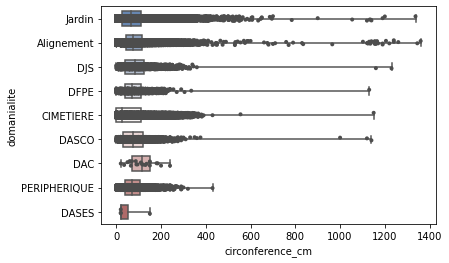

In [17]:
sns.boxplot(x="circonference_cm", y="domanialite", data=data_trees,
            whis=[0, 100], width=.6, palette="vlag")
sns.stripplot(x="circonference_cm", y="domanialite", data=data_trees,
              size=4, color=".3", linewidth=0)

<AxesSubplot:xlabel='hauteur_m', ylabel='domanialite'>

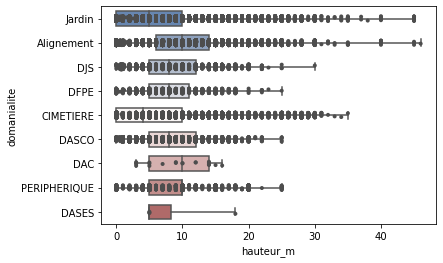

In [18]:
sns.boxplot(x="hauteur_m", y="domanialite", data=data_trees,
            whis=[0, 100], width=.6, palette="vlag")
sns.stripplot(x="hauteur_m", y="domanialite", data=data_trees,
              size=4, color=".3", linewidth=0)

On calcule désormais des statistiques de base selon la domanialtié

In [19]:
df= data_trees.query('hauteur_m < 50')
df_statbydom = df.groupby('domanialite')['hauteur_m'].describe().sort_values(by='count', ascending=False)
df_statbydom.T

domanialite,Alignement,Jardin,CIMETIERE,DASCO,PERIPHERIQUE,DJS,DFPE,DAC,DASES
count,104822.000000,46247.000000,31914.000000,6417.000000,5325.000000,3899.000000,1324.000000,21.000000,4.00
mean,10.006963,6.118375,5.893804,8.291554,8.446948,8.566376,8.076095,9.380952,8.25
std,5.264635,6.753851,7.041620,4.736122,4.303046,4.684321,4.548974,4.598654,6.50
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,3.000000,5.00
25%,6.000000,0.000000,0.000000,5.000000,5.000000,5.000000,5.000000,5.000000,5.00
50%,10.000000,5.000000,4.000000,8.000000,10.000000,8.000000,8.000000,10.000000,5.00
75%,14.000000,10.000000,10.000000,12.000000,10.000000,12.000000,11.000000,14.000000,8.25
max,46.000000,45.000000,35.000000,25.000000,25.000000,30.000000,25.000000,16.000000,18.00


In [20]:
# print('Hauteur moyenne des arbres mesurant moins de 50 m par',df_statbydom['mean'].sort_values(ascending=False))
df_statbydom.T.loc['mean']

domanialite
Alignement      10.006963
Jardin           6.118375
CIMETIERE        5.893804
DASCO            8.291554
PERIPHERIQUE     8.446948
DJS              8.566376
DFPE             8.076095
DAC              9.380952
DASES            8.250000
Name: mean, dtype: float64

<AxesSubplot:xlabel='hauteur_m', ylabel='domanialite'>

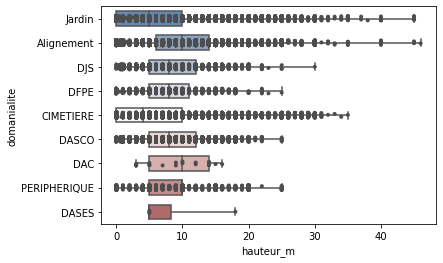

In [21]:
sns.boxplot(x="hauteur_m", y="domanialite", data=data.query('hauteur_m < 50'),
            whis=[0, 100], width=.6, palette="vlag")
sns.stripplot(x="hauteur_m", y="domanialite", data=data.query('hauteur_m < 50'),
              size=4, color=".3", linewidth=0)

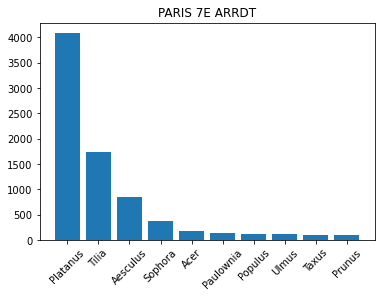

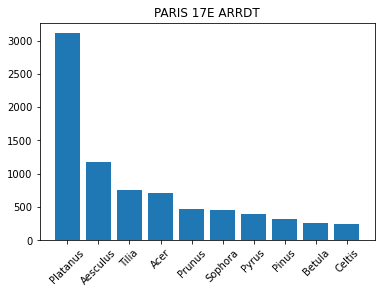

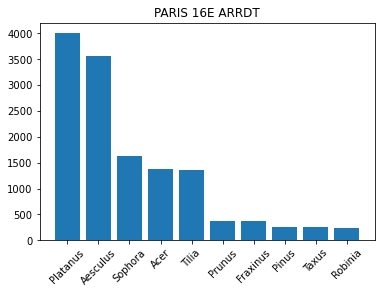

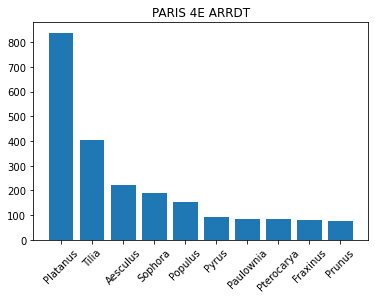

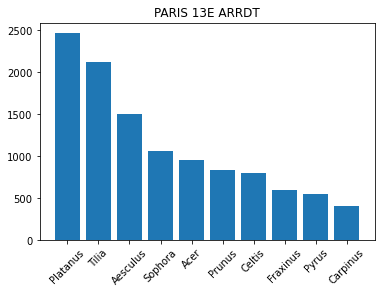

...

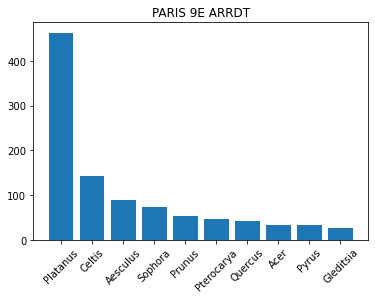

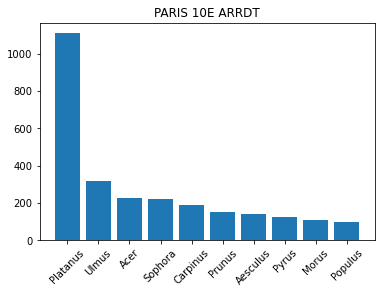

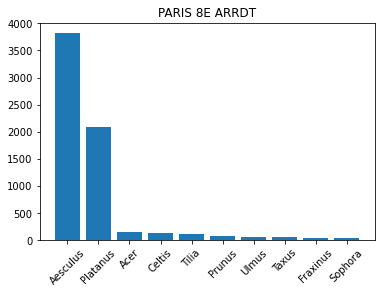

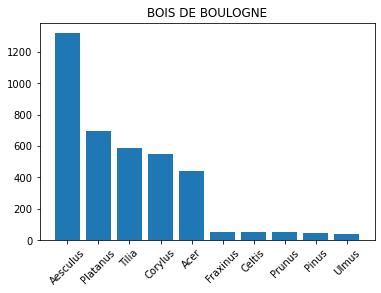

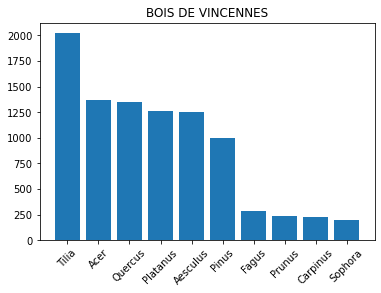

In [22]:
for i in df.groupby(pd.Grouper('arrondissement')):
    df_top = i[1].groupby('genre').size().nlargest(10)
    plt.bar(df_top.index,df_top.values)
    plt.title(i[0])
    plt.xticks(rotation=45)
    plt.show()

In [23]:
df_scat_dom = df[['id','domanialite','genre','hauteur_m','geo_point_2d_a','geo_point_2d_b','circonference_cm','stade_developpement']]
df_scat_dom = df_scat_dom.dropna()
# df_scat_dom['espece']=df[df['id']==df_scat_dom['id']].espece
# df[df_scat_dom].dropna().info()
df.info()
# i[1].groupby('genre').size().nlargest(10).values

<class 'pandas.core.frame.DataFrame'>
Int64Index: 199974 entries, 0 to 200136
Data columns (total 10 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   id                   199974 non-null  int64  
 1   domanialite          199973 non-null  object 
 2   arrondissement       199974 non-null  object 
 3   genre                199958 non-null  object 
 4   circonference_cm     199974 non-null  int64  
 5   hauteur_m            199974 non-null  float64
 6   stade_developpement  132776 non-null  object 
 7   remarquable          136880 non-null  float64
 8   geo_point_2d_a       199974 non-null  float64
 9   geo_point_2d_b       199974 non-null  float64
dtypes: float64(4), int64(2), object(4)
memory usage: 16.8+ MB


In [24]:
px.set_mapbox_access_token("pk.eyJ1IjoicC1tYXR0IiwiYSI6ImNrdXA5ZDN0aDE2MGYyb3AxcmQ2NnJ0b3MifQ.A1l79VIwZtN9hyfDgs930Q") 
fig2 = px.scatter_mapbox(df_scat_dom[df_scat_dom['domanialite']=='Jardin'], lat="geo_point_2d_a", lon="geo_point_2d_b", mapbox_style='satellite', color="genre", hover_name="genre", zoom=11, height=700) 
fig2.update_traces(marker=dict(size=4))

In [25]:
px.set_mapbox_access_token("pk.eyJ1IjoicC1tYXR0IiwiYSI6ImNrdXA5ZDN0aDE2MGYyb3AxcmQ2NnJ0b3MifQ.A1l79VIwZtN9hyfDgs930Q") 
fig2 = px.scatter_mapbox(df_scat_dom[df_scat_dom['domanialite']=='Jardin'].loc[(df_scat_dom['genre']=='Platanus')|(df_scat_dom['genre']=='Tilia')], lat="geo_point_2d_a", lon="geo_point_2d_b", mapbox_style='satellite', color="genre", hover_name="stade_developpement", zoom=11, height=700) 
fig2.update_traces(marker=dict(size=4))

In [26]:
# px.set_mapbox_access_token("pk.eyJ1IjoicC1tYXR0IiwiYSI6ImNrdXA5ZDN0aDE2MGYyb3AxcmQ2NnJ0b3MifQ.A1l79VIwZtN9hyfDgs930Q") 
fig2 = px.scatter_mapbox(df_scat_dom[df_scat_dom['genre']=='Platanus'], lat="geo_point_2d_a", lon="geo_point_2d_b", mapbox_style="streets", color="stade_developpement", hover_name="genre", zoom=11, height=700) 
fig2.update_traces(marker=dict(size=10), text='hauteur_m')

In [27]:
#fig2 = px.scatter_mapbox(df_scat_dom, lat="geo_point_2d_a", lon="geo_point_2d_b", mapbox_style="streets", color="domanialite", hover_name="genre", zoom=11, height=700) 
#fig2.update_traces(marker=dict(size=df_chauteur_m))

In [28]:
df_scat_dom[df_scat_dom['domanialite']=='Jardin'].loc[(df_scat_dom['genre']=='Platanus')|(df_scat_dom['genre']=='Tilia')]

,id,domanialite,genre,hauteur_m,geo_point_2d_a,geo_point_2d_b,circonference_cm,stade_developpement
150,100032,Jardin,Tilia,10.0,48.821805,2.376479,190,M
151,100033,Jardin,Tilia,10.0,48.821857,2.376449,140,A
152,100034,Jardin,Tilia,10.0,48.821815,2.376292,125,A
321,100371,Jardin,Tilia,10.0,48.837293,2.378225,60,A
322,100372,Jardin,Tilia,10.0,48.837335,2.378173,65,A
...,...,...,...,...,...,...,...,...
197037,2020688,Jardin,Platanus,7.0,48.898656,2.360347,50,J
197209,2020881,Jardin,Tilia,16.0,48.849365,2.413914,170,M
198320,2022304,Jardin,Tilia,4.0,48.821353,2.335442,34,JA
198340,2022325,Jardin,Tilia,14.0,48.820981,2.339228,109,A


<AxesSubplot:xlabel='geo_point_2d_a', ylabel='geo_point_2d_b'>

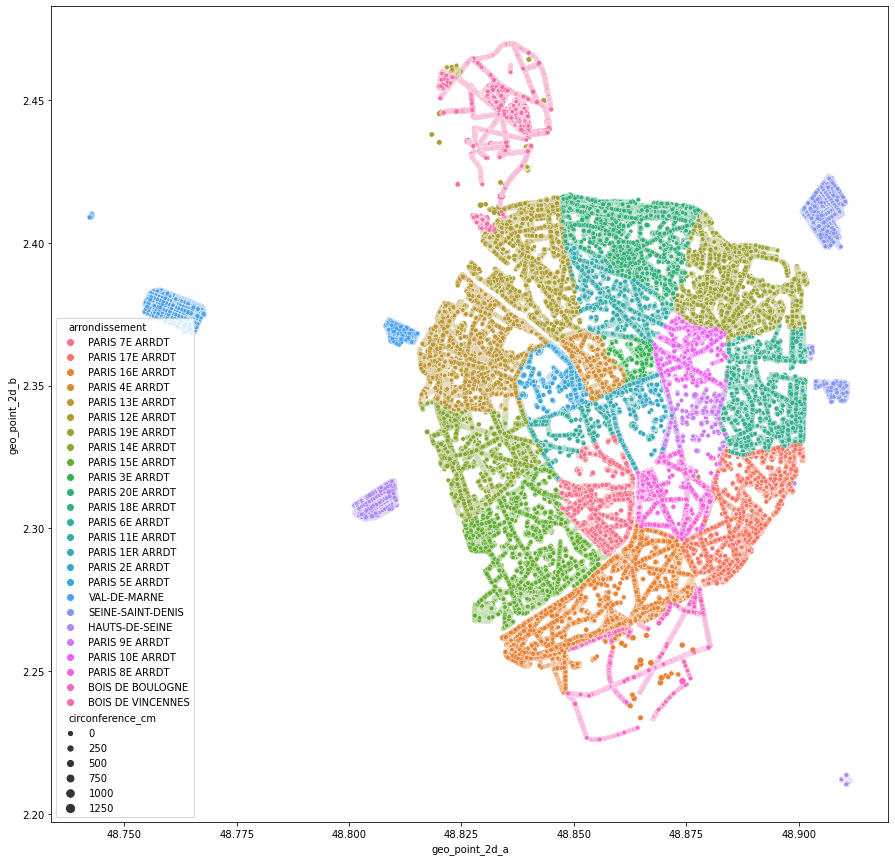

In [29]:
f, ax = plt.subplots(figsize=(15, 15))
sns.scatterplot(x="geo_point_2d_a", y="geo_point_2d_b",
                hue="arrondissement",size = 'circonference_cm',
#                 palette="ch:r=-.2,d=.3_r",
#                 hue_order=clarity_ranking,
#                 sizes=(5, 15), linewidth=1,
                data=data_trees[data_trees['hauteur_m']<1000], ax= ax)

<AxesSubplot:xlabel='geo_point_2d_a', ylabel='geo_point_2d_b'>

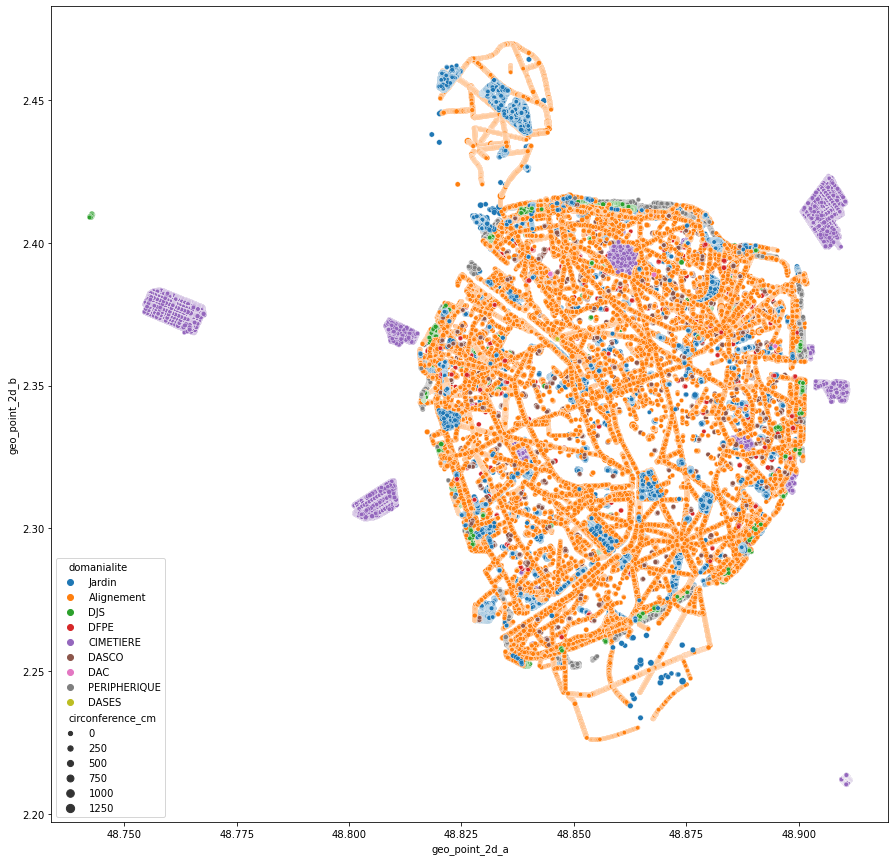

In [30]:
df_plat = data_trees[data_trees['genre'] == 'Platanus']
f, ax = plt.subplots(figsize=(15, 15))
sns.scatterplot(x="geo_point_2d_a", y="geo_point_2d_b",
                hue="domanialite",size = 'circonference_cm',
#                 palette="ch:r=-.2,d=.3_r",
#                 hue_order=clarity_ranking,
#                 sizes=(5, 15), linewidth=1,
                data=df)

In [31]:
df_pie = df[df['domanialite']=='Jardin'].groupby('genre').count()
data = np.concatenate((np.reshape(df_pie.index,(len(df_pie),1)), np.reshape(df_pie.values[:,0],(len(df_pie),1))),axis=1)
fig = px.pie(data, values=data[:,1], names=data[:,0])
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

## Stade de développement

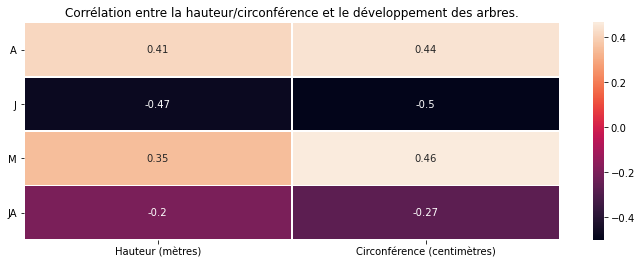

In [32]:
# Age de l'arbre
temp = df[df['circonference_cm'] < 600]
temp = temp[temp['hauteur_m'] < 200]
dev = temp[['circonference_cm', 'hauteur_m', 'stade_developpement']].dropna()

dev['A'] = dev['stade_developpement'] == 'A'
dev['J'] = dev['stade_developpement'] == 'J'
dev['M'] = dev['stade_developpement'] == 'M'
dev['JA'] = dev['stade_developpement'] == 'JA'

cr = dev.corr()
final_cr = cr.loc[['A', 'J', 'M', 'JA'], ['hauteur_m', 'circonference_cm']]
plot = sns.heatmap(final_cr, annot=True, linewidths=.7)
plot.set_title('Corrélation entre la hauteur/circonférence et le développement des arbres.')
plot.set_xticklabels(['Hauteur (mètres)', 'Circonférence (centimètres)'])

fig = plt.gcf()
fig.set_size_inches(12, 4)
plt.yticks(rotation=0)
plt.savefig('graphs/Développement_taille_corr.png', bbox_inches='tight')

# 4. Analyse

## a. Domanialite

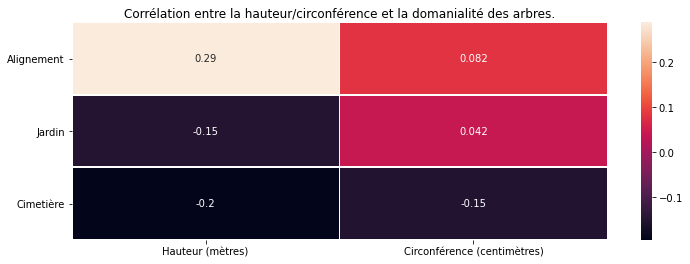

In [34]:
from sklearn.preprocessing import OneHotEncoder
dom_list = ['Alignement', 'Jardin', 'CIMETIERE']

temp = df[df['circonference_cm'] < 600]
temp = temp[temp['hauteur_m'] < 200]
temp = temp[temp.domanialite.isin(dom_list)]

new_name = {0: 'Alignement',
         1: 'CIMETIERE', 
         2: 'Jardin'}

# On cherche à créer des colonnes de variables boolèennes par one-hot encoding
dom = temp[['circonference_cm', 'hauteur_m', 'domanialite']].dropna()
encoder = OneHotEncoder(handle_unknown='ignore')
encoder_dom = pd.DataFrame(encoder.fit_transform(dom[['domanialite']]).toarray())
final_dom = dom.join(encoder_dom)
final_dom.rename(columns = new_name, inplace = True)

cr = final_dom.corr()
final_cr = cr.loc[['Alignement', 'Jardin', 'CIMETIERE'], ['hauteur_m', 'circonference_cm']]
plot = sns.heatmap(final_cr, annot=True, linewidths=.7)
plot.set_xticklabels(['Hauteur (mètres)', 'Circonférence (centimètres)'])
plot.set_yticklabels(['Alignement', 'Jardin', 'Cimetière'])
plot.set_title('Corrélation entre la hauteur/circonférence et la domanialité des arbres.')

fig = plt.gcf()
fig.set_size_inches(12, 4)
plt.yticks(rotation=0)
plt.savefig('graphs/Domanialité_taille_corr.png', bbox_inches='tight')

On trouve une corrélation entre la domanialité et les dimensions des arbres.

Ainsi, l'équipe consacrée à l'entretien des alignements devra s'équiper pour traiter des arbres plus massifs que ceux des cimetières

In [35]:
final_dom[['domanialite', 'hauteur_m', 'circonference_cm']].groupby(by = 'domanialite').mean()

,hauteur_m,circonference_cm
domanialite,,
Alignement,10.005611,85.319496
CIMETIERE,5.893675,61.775421
Jardin,6.112694,78.093928


C'est une donnée qu'on retrouve dans l'analyse de la moyenne. Les arbres sont en moyenne plus haut et épais le long des routes.

Cela est moins évident concernant les cimetières et les jardins.

In [36]:
final_dom[['domanialite', 'hauteur_m', 'circonference_cm']].groupby(by = 'domanialite').std()

,hauteur_m,circonference_cm
domanialite,,
Alignement,5.264242,54.208246
CIMETIERE,7.041693,75.568727
Jardin,6.745631,71.203632


bb

## b. Répartition des espèces

In [39]:
# Repartition en fonction de la domanialité
align = df[df['domanialite'] == 'Alignement']
jardin = df[df['domanialite'] == 'Jardin']
cimetiere = df[df['domanialite'] == 'CIMETIERE']

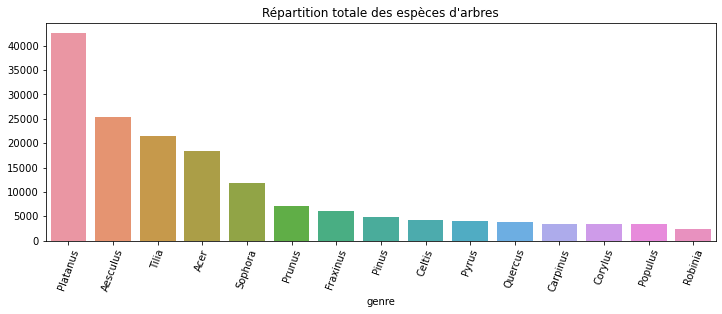

In [40]:
# Repartition totale des espèces

temp = df.groupby(by = 'genre').count()['id'].sort_values(ascending = False)[:15]
most_trees = temp.index.to_list()
plot = sns.barplot(x = temp.index, y = temp.values)
plot.set(title="Répartition totale des espèces d'arbres")

plt.xticks(rotation=70)
fig = plt.gcf()
fig.set_size_inches(12, 4)
plt.savefig('graphs/genre_répartition.png', bbox_inches='tight')

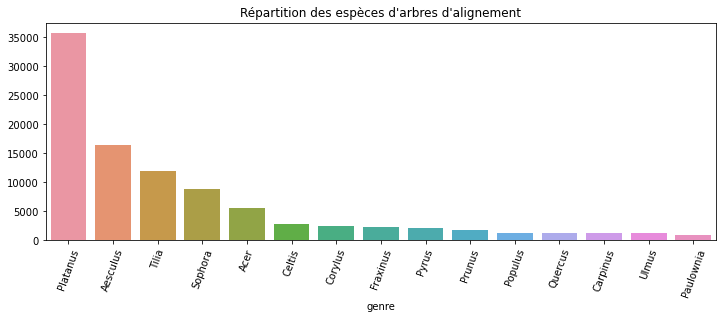

In [41]:
# Répartition des alignements

temp = align.groupby(by = 'genre').count()['id'].sort_values(ascending = False)[:15]
plot = sns.barplot(x = temp.index, y = temp.values)
plot.set(title="Répartition des espèces d'arbres d'alignement")

plt.xticks(rotation=70)
fig = plt.gcf()
fig.set_size_inches(12, 4)
plt.savefig('graphs/alignement_genre_répartition.png', bbox_inches='tight')

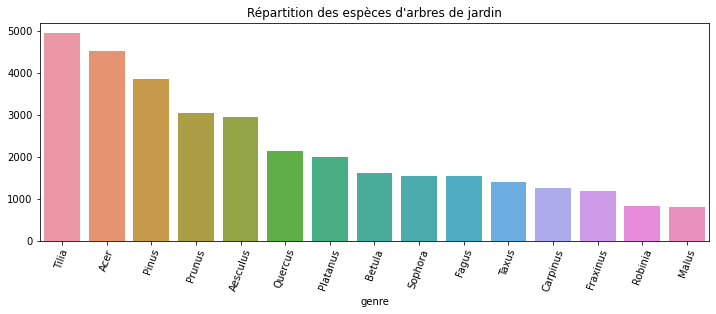

In [42]:
# Répartition des jardins

temp = jardin.groupby(by = 'genre').count()['id'].sort_values(ascending = False)[:15]
plot = sns.barplot(x = temp.index, y = temp.values)
plot.set(title="Répartition des espèces d'arbres de jardin")

plt.xticks(rotation=70)
fig = plt.gcf()
fig.set_size_inches(12, 4)
plt.savefig('graphs/jardin_genre_répartition.png', bbox_inches='tight')

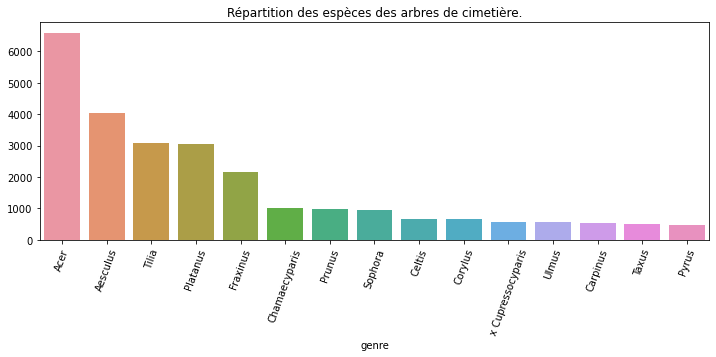

In [43]:
# Répartition des cimetières

temp = cimetiere.groupby(by = 'genre').count()['id'].sort_values(ascending = False)[:15]
plot = sns.barplot(x = temp.index, y = temp.values)
plot.set_title('Répartition des espèces des arbres de cimetière.')

plt.xticks(rotation=70)
fig = plt.gcf()
fig.set_size_inches(12, 4)
plt.savefig('graphs/cimetière_genre_répartition.png', bbox_inches='tight')

On constate une distribution différente d'une domanialité à une autre:

* Les arbres d'alignement sont composés en grande partie de platanes, ce sont également qu'on trouve presque tous les platanes de la ville (35000/40000)
* Les arbres des cimetières comprennent surtout des érables (Acer), marroniers (Aeschulus), tilleuls (Tillia), platanes et frênes (Fraxinus)
* Les arbres de jardin sont plus variés 

Nous recommandons donc de concentrer des tournées sur des espèces particulièrement présentes sur une dominalité